<a href="https://colab.research.google.com/github/wypa93/pyspark_sentiment/blob/main/CS777_TextProcessing_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Description

**Objective & Process:** The aim of this project is to accuratly identify sentiments in news titles that stem from financial news. Therefore, an annotated corpus of 200,000 headlines is used to train a variaty of classification model types using the PySpark Library. Beyond that, different approaches of text pre-processing and feature generation are explored to maximize performance. The process is designed as follows:

*   Visual Data Exploration
*   Data Pre-Processing (Tokenization, Count Vectorization, Word2Vec Embedding)
*   Model Training & Evaluation

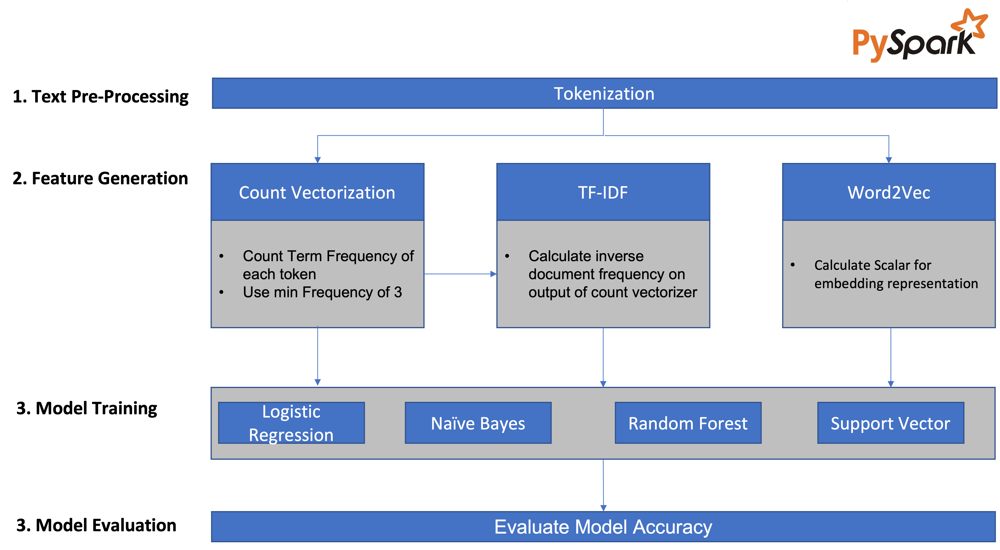

**Data Source:** The dataset used for this project contains 92,382 positive and 108,118 negative texts that were scraped from the news portals Economic Times, Money Control, Livemint, Business Today, Financial Express,NY Times, WSJ, and Washington Post between Jan 1, 2017 and April 15, 2021 ([Data Source Link](https://www.kaggle.com/datasets/harshrkh/india-financial-news-headlines-sentiments))

**Findings:**
Best performance with Count Vectorization and Support Vector Machine (0.77 Accuaracy) 

## PySpark Set up for Google Colab

In [1]:
!pip install wget
#Run below commands in google colab
# install Java8
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
# download spark3.0.0
!wget -q https://archive.apache.org/dist/spark/spark-3.2.1/spark-3.2.1-bin-hadoop2.7.tgz
# unzip ity
!tar xf spark-3.2.1-bin-hadoop2.7.tgz
# install findspark 
!pip install -q findspark

import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.2.1-bin-hadoop2.7"

import findspark
findspark.init()
from pyspark.sql import SparkSession
spark = SparkSession.builder.master("local[*]").getOrCreate()
# Test the spark
df = spark.createDataFrame([{"hello": "world"} for x in range(1000)])
df.show(3, False)

# Check the pyspark version
import pyspark
print(pyspark.__version__)

from pyspark.sql import SparkSession

spark = SparkSession.builder\
        .master("local")\
        .appName("Colab")\
        .config('spark.ui.port', '4050')\
        .getOrCreate()

spark

!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip ngrok-stable-linux-amd64.zip
get_ipython().system_raw('./ngrok http 4050 &')
!curl -s http://localhost:4040/api/tunnels

from pyspark.sql import SparkSession
spark = SparkSession.builder \
    .master("local[4]") \
    .appName("Learning_Spark") \
    .getOrCreate()

sc = spark.sparkContext
lines = sc.textFile("spark-2.4.4-bin-hadoop2.7/README.md")

data = range(1,11)
distData = sc.parallelize(data)
distData

result = distData.map(lambda x: (x, 2**x, 10**x))
result

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=9e76e2b1dc6b7090b9ab8dbe27d1fda06cea454d325f6ae02a00c386a328d730
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
+-----+
|hello|
+-----+
|world|
|world|
|world|
+-----+
only showing top 3 rows

3.2.1
--2022-04-24 20:02:53--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 18.205.222.128, 54.161.241.46, 54.237.133.81, ...
Connecting to bin.equinox.io (bin.equinox.io)|18.205.222.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13832437 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip’

ngrok-stable-linux- 100%[===================>]  13.19M  6.58MB/s    in 2.0s    

2022-04-24 20:02:56 (6.58 MB/s) - ‘ngrok-stable-linux-amd64.zip’ saved [13832437/13832437]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok   

PythonRDD[10] at RDD at PythonRDD.scala:53

In [2]:
from pyspark import SparkContext

from pyspark.sql import SparkSession

from pyspark.sql.window import Window

from pyspark.sql.functions import col, expr, when,\
desc, first, last, row_number, rank, substring, regexp_replace
from pyspark.sql.functions import year

from pyspark.sql.functions import sum, min, max, avg, mean, count, countDistinct

from pyspark.sql.functions import max as pmax, min as pmin, countDistinct

from pyspark.ml.feature import Tokenizer, RegexTokenizer, CountVectorizer, \
           StopWordsRemover, NGram, HashingTF, IDF, Word2Vec

from pyspark.sql.functions import explode, expr
from pyspark.ml.functions  import vector_to_array

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

from google.colab import drive

In [3]:
spark = SparkSession.builder.appName(
    "TextProcessing").getOrCreate()
spark

In [4]:
sc = spark.sparkContext
sc

<SparkContext master=local[*] appName=pyspark-shell>

## Load Data & Dependencies

In [5]:
from pyspark.sql.functions import length, size
from pyspark.ml.feature import VectorAssembler
from pyspark.ml import Pipeline
from pyspark.ml.classification import LogisticRegression, NaiveBayes,RandomForestClassifier,MultilayerPerceptronClassifier,LinearSVC,GBTClassifier
from pyspark.ml.feature import RegexTokenizer,StopWordsRemover, PCA
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.sql.functions import monotonically_increasing_id 
import plotly.express as px
import pandas as pd
import numpy as np

In [6]:
#load stocks news df
drive.mount('/content/drive')
text_df=spark.read.csv('/content/drive/MyDrive/Boston University /CS777_Big_Data/Project/News_sentiment_Jan2017_to_Apr2021.csv',
                       inferSchema=True,header=True)

#apply changes to Target Class (Sentiment)
text_df=text_df.withColumnRenamed('Title','Review').select('Review','Sentiment')

text_df=text_df.withColumn('Sentiment', regexp_replace('Sentiment', 'POSITIVE', '1'))
text_df=text_df.withColumn('Sentiment', regexp_replace('Sentiment', 'NEGATIVE', '0'))
text_df=text_df.selectExpr('Review', 'INT(Sentiment)')
text_df = text_df.withColumn('length',length(text_df['Review']))
text_df=text_df.withColumn('id',monotonically_increasing_id())

Mounted at /content/drive


In [7]:
text_df.show(3, truncate=False)

+------------------------------------------------------------------------+---------+------+---+
|Review                                                                  |Sentiment|length|id |
+------------------------------------------------------------------------+---------+------+---+
|Eliminating shadow economy to have positive impact on GDP : Arun Jaitley|1        |72    |0  |
|Two Chinese companies hit roadblock with Indian investments             |0        |59    |1  |
|SoftBank India Vision gets new $100                                     |1        |35    |2  |
+------------------------------------------------------------------------+---------+------+---+
only showing top 3 rows



In [8]:
text_df.groupBy('Sentiment').count().show()

+---------+------+
|Sentiment| count|
+---------+------+
|        1| 92382|
|        0|108118|
+---------+------+



## Exploratory Data Analysis

## ML Version 1: Count Vectorization

In [ ]:
class evalModel:
  def __init__(self,model,text_df):
    #instantiating object
    self.model = model
    self.text_df = text_df
    self.cv_df = None
    self.training_df = None
    self.test_df = None
    self.predictions = None
    self.accuracy = None
    self.model_fitted = None

    #calling methods
    self.textProcessing()
    self.trainTestSplit()
    self.fitTransformPipeline()
    self.evalResults()

  def textProcessing(self):
    ##tokenize sentences
    tokenizer = RegexTokenizer(inputCol="Review",outputCol="raw_tokens",pattern= "\\W")
    rawTokenizedDF = tokenizer.transform(self.text_df)
    ##remove stopwords
    remover = StopWordsRemover(inputCol="raw_tokens",outputCol="noStop_tokens")
    noStopTokenizedDF = remover.transform(rawTokenizedDF)
    noStopTokenizedDF = noStopTokenizedDF.withColumn('numTokens',size(noStopTokenizedDF['noStop_tokens']))
    ##apply count vectorization
    countVectorizer = CountVectorizer(inputCol='noStop_tokens',outputCol='word_features',minDF=3)
    cv_model = countVectorizer.fit(noStopTokenizedDF)
    self.cv_df = cv_model.transform(noStopTokenizedDF)

  def trainTestSplit(self):
    self.training_df, self.test_df = self.cv_df.randomSplit([0.75,0.25], seed=777)

  def fitTransformPipeline(self):
    #define processing pipeline
    vecAssembler = VectorAssembler(inputCols=['word_features', 'numTokens'],outputCol='features')
    pipeline = Pipeline(stages=[vecAssembler, self.model])
    self.model_fitted = pipeline.fit(self.training_df)
    #transform
    self.predictions = self.model_fitted.transform(self.test_df)

  def evalResults(self):
    #confusion matrix
    evaluator = MulticlassClassificationEvaluator(labelCol="Sentiment", predictionCol="prediction",metricName="accuracy")
    self.accuracy = evaluator.evaluate(self.predictions)

In [ ]:
#define models & Hyper Parameters
nb_model = NaiveBayes(featuresCol='features', labelCol='Sentiment')
rf_model = RandomForestClassifier(featuresCol = 'features', labelCol = 'Sentiment',numTrees=20)
lr_model = LogisticRegression(featuresCol='features', labelCol='Sentiment',threshold=0.5)
svc_model = LinearSVC(featuresCol = 'features', labelCol = 'Sentiment',maxIter=10, regParam=0.1)

#instantiate objects
nb = evalModel(model=nb_model,text_df=text_df)
rf = evalModel(model=rf_model,text_df=text_df)
lr = evalModel(model=lr_model,text_df=text_df)
svc = evalModel(model=svc_model,text_df=text_df)

#print accuracy for each model instance
print('Naive Bayes:',nb.accuracy)
print('Random Forest:',rf.accuracy)
print('Logistic Regression:',lr.accuracy)
print('SVC:',svc.accuracy)

Naive Bayes: 0.7401592083474652
Random Forest: 0.5472338048400933
Logistic Regression: 0.7627037487780061
SVC: 0.7743151846457714


## ML Version 2: TF-IDF

In [ ]:
class evalModeltfid:
  def __init__(self,model,text_df):
    #instantiating object
    self.model = model
    self.text_df = text_df
    self.cv_df = None
    self.training_df = None
    self.test_df = None
    self.predictions = None
    self.accuracy = None
    self.model_fitted = None

    #calling methods
    self.textProcessing()
    self.trainTestSplit()
    self.fitTransformPipeline()
    self.evalResults()

  def textProcessing(self):
    ##tokenize sentences
    tokenizer = RegexTokenizer(inputCol="Review",outputCol="raw_tokens",pattern= "\\W")
    rawTokenizedDF = tokenizer.transform(self.text_df)
    ##remove stopwords
    remover = StopWordsRemover(inputCol="raw_tokens",outputCol="noStop_tokens")
    noStopTokenizedDF = remover.transform(rawTokenizedDF)
    noStopTokenizedDF = noStopTokenizedDF.withColumn('numTokens',size(noStopTokenizedDF['noStop_tokens']))
    ##apply count vectorization
    countVectorizer = CountVectorizer(inputCol='noStop_tokens',outputCol='rawFeatures',minDF=3)
    cv_model = countVectorizer.fit(noStopTokenizedDF)
    featurizedData = cv_model.transform(noStopTokenizedDF)
    ##apply IDF
    idf = IDF(inputCol="rawFeatures", outputCol="idf_features")
    idfModel = idf.fit(featurizedData)
    self.cv_df = idfModel.transform(featurizedData)

  def trainTestSplit(self):
    self.training_df, self.test_df = self.cv_df.randomSplit([0.75,0.25], seed=777)

  def fitTransformPipeline(self):
    #define processing pipeline
    vecAssembler = VectorAssembler(inputCols=['idf_features', 'numTokens'],outputCol='features')
    pipeline = Pipeline(stages=[vecAssembler, self.model])
    self.model_fitted = pipeline.fit(self.training_df)
    #transform
    self.predictions = self.model_fitted.transform(self.test_df)

  def evalResults(self):
    #confusion matrix
    evaluator = MulticlassClassificationEvaluator(labelCol="Sentiment", predictionCol="prediction",metricName="accuracy")
    self.accuracy = evaluator.evaluate(self.predictions)

In [ ]:
#define models & Hyper Parameters
nb_model = NaiveBayes(featuresCol='idf_features', labelCol='Sentiment')
rf_model = RandomForestClassifier(featuresCol = 'idf_features', labelCol = 'Sentiment',numTrees=20)
lr_model = LogisticRegression(featuresCol='idf_features', labelCol='Sentiment',threshold=0.5)
svc_model = LinearSVC(featuresCol = 'idf_features', labelCol = 'Sentiment',maxIter=10, regParam=0.1)

#instantiate objects
nb = evalModeltfid(model=nb_model,text_df=text_df)
rf = evalModeltfid(model=rf_model,text_df=text_df)
lr = evalModeltfid(model=lr_model,text_df=text_df)
svc = evalModeltfid(model=svc_model,text_df=text_df)

#print accuracy for each model instance
print('Naive Bayes:',nb.accuracy)
print('Random Forest:',rf.accuracy)
print('Logistic Regression:',lr.accuracy)
print('SVC:',svc.accuracy)

Naive Bayes: 0.733335993456098
Random Forest: 0.5486902220537477
Logistic Regression: 0.7625840432535962
SVC: 0.7735770005785767


## ML Version 3: Word2Vec

In [ ]:
w2v_input = svc.cv_df.select('id','noStop_tokens','Sentiment')
w2v_input.show(2)

+---+--------------------+---------+
| id|       noStop_tokens|Sentiment|
+---+--------------------+---------+
|  0|[eliminating, sha...|        1|
|  1|[two, chinese, co...|        0|
+---+--------------------+---------+
only showing top 2 rows



In [ ]:
#fit word2vec
word2Vec = Word2Vec(vectorSize=4, minCount=1, windowSize=2,
                    seed=777, 
                    inputCol="noStop_tokens", 
                    outputCol="wordVector")

model = word2Vec.fit(w2v_input)

#transform word2vec
w2v_output = model.transform(w2v_input)

#reduce dimensioanlity with PCA
pca = PCA(k=3, inputCol="wordVector", outputCol="pcaFeatures")
pcaModel = pca.fit(w2v_output)
pcaDF = pcaModel.transform(w2v_output)

#transform to pandas df
pandasDF = pcaDF.withColumn(
    'V1', vector_to_array('pcaFeatures')[0]
).withColumn(
    'V2', vector_to_array('pcaFeatures')[1]
).withColumn('V3',vector_to_array('pcaFeatures')[2]
             ).select('V1', 'V2','V3', 'Sentiment').toPandas()

#visualize in 3D space
px.scatter_3d(pandasDF,x='V1',y='V2',z='V3',color='Sentiment')

In [ ]:
#use word2Vec as classification input variables
class evalModelw2v:
  def __init__(self,model,text_df):
    #instantiating object
    self.model = model
    self.text_df = text_df
    self.cv_df = None
    self.training_df = None
    self.test_df = None
    self.predictions = None
    self.accuracy = None
    self.model_fitted = None

    #calling methods
    self.textProcessing()
    self.trainTestSplit()
    self.fitTransformPipeline()
    self.evalResults()

  def textProcessing(self,text_df=None):
    ##tokenize sentences
    tokenizer = RegexTokenizer(inputCol="Review",outputCol="raw_tokens",pattern= "\\W")
    rawTokenizedDF = tokenizer.transform(self.text_df)
    ##remove stopwords
    remover = StopWordsRemover(inputCol="raw_tokens",outputCol="noStop_tokens")
    noStopTokenizedDF = remover.transform(rawTokenizedDF)
    noStopTokenizedDF = noStopTokenizedDF.withColumn('numTokens',size(noStopTokenizedDF['noStop_tokens']))
    ##apply word2vec vectorization
    word2Vec = Word2Vec(vectorSize=4, minCount=1, windowSize=2,
                    seed=777, 
                    inputCol="noStop_tokens", 
                    outputCol="wordVector")
    w2c_model = word2Vec.fit(noStopTokenizedDF)
    self.cv_df = w2c_model.transform(noStopTokenizedDF)

  def trainTestSplit(self):
    self.training_df, self.test_df = self.cv_df.randomSplit([0.75,0.25], seed=777)

  def fitTransformPipeline(self):
    #define processing pipeline
    vecAssembler = VectorAssembler(inputCols=['wordVector'],outputCol='features')
    pipeline = Pipeline(stages=[vecAssembler, self.model])
    self.model_fitted = pipeline.fit(self.training_df)
    #transform
    self.predictions = self.model_fitted.transform(self.test_df)

  def evalResults(self):
    #confusion matrix
    evaluator = MulticlassClassificationEvaluator(labelCol="Sentiment", predictionCol="prediction",metricName="accuracy")
    self.accuracy = evaluator.evaluate(self.predictions)

In [ ]:
#define models & Hyper Parameters
nb_model = NaiveBayes(featuresCol='features', labelCol='Sentiment')
rf_model = RandomForestClassifier(featuresCol = 'features', labelCol = 'Sentiment',numTrees=20)
lr_model = LogisticRegression(featuresCol='features', labelCol='Sentiment',threshold=0.5)
svc_model = LinearSVC(featuresCol = 'features', labelCol = 'Sentiment',maxIter=10, regParam=0.1)

#instantiate objects
nb = evalModelw2v(model=nb_model,text_df=text_df)
rf = evalModelw2v(model=rf_model,text_df=text_df)
lr = evalModelw2v(model=lr_model,text_df=text_df)
svc = evalModelw2v(model=svc_model,text_df=text_df)

#print accuracy for each model instance
print('Naive Bayes:',nb.accuracy)
print('Random Forest:',rf.accuracy)
print('Logistic Regression:',lr.accuracy)
print('SVC:',svc.accuracy)

In [ ]:
svc_model = LinearSVC(featuresCol = 'features', labelCol = 'Sentiment',maxIter=10, regParam=0.1)
svc_w2v = evalModelw2v(model=svc_model,text_df=text_df)
print('SVC:',svc_w2v.accuracy)

SVC: 0.5393731420705066


In [ ]:
lr_model = LogisticRegression(featuresCol='features', labelCol='Sentiment',threshold=0.5)
lr_w2v = evalModelw2v(model=lr_model,text_df=text_df)
print('SVC:',lr_w2v.accuracy)

SVC: 0.5711150569598787


In [ ]:
rf_model = RandomForestClassifier(featuresCol = 'features', labelCol = 'Sentiment',numTrees=100)
rf_w2v = evalModelw2v(model=rf_model,text_df=text_df)
print('SVC:',rf_w2v.accuracy)

SVC: 0.5922231310975001


## Topic Modeling

- Probablistic approach (LDA - Latent Dirichlet Allocation)
  - Each document as a mixture of smaller number of topics
  - Words and documents get probability scores for each topic
- Matrix factorization approach (NMF - Non-negative Matrix Factorization)
   - Decompose a single matrix (document-term matrix) into a set of smaller matrices

### LDA

- Infers topics from a collection of text documents
- Similar to unsupervised clustering algorithm
  - Topics correspond to cluster centers
  - Documents correspond to rows in the dataset
  - Feature vectors are vectors of word counts

In [ ]:
from pyspark.ml.clustering import LDA
from pyspark.ml.linalg import Vectors, SparseVector

In [ ]:
df = spark.createDataFrame([
    [1, Vectors.dense([0, 1, 0, 1])],
    [2, Vectors.dense([1, 0, 1, 0])],
    [3, Vectors.dense([1, 0, 0, 1])]], 
    ["id", "features"])
df.show()

+---+-----------------+
| id|         features|
+---+-----------------+
|  1|[0.0,1.0,0.0,1.0]|
|  2|[1.0,0.0,1.0,0.0]|
|  3|[1.0,0.0,0.0,1.0]|
+---+-----------------+



In [ ]:
lda = LDA(k=2, seed=1, optimizer="em")

lda_model = lda.fit(df)

In [ ]:
lda_model.vocabSize()

4

In [ ]:
lda_model.describeTopics().show(truncate=False)

+-----+------------+---------------------------------------------------------------------------------+
|topic|termIndices |termWeights                                                                      |
+-----+------------+---------------------------------------------------------------------------------+
|0    |[0, 3, 1, 2]|[0.3458515785691157, 0.32696680461812455, 0.1642078449547122, 0.1629737718580475]|
|1    |[3, 0, 2, 1]|[0.3397070216305515, 0.320801010504032, 0.1703637143793906, 0.16912825348602595] |
+-----+------------+---------------------------------------------------------------------------------+



/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pyspark/sql/context.py:125: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


In [ ]:
lda_model.topicsMatrix()

DenseMatrix(4, 2, [1.0381, 0.4929, 0.4892, 0.9815, 0.9619, 0.5071, 0.5108, 1.0185], 0)

In [ ]:
lda_model.topicsMatrix().toArray()

array([[1.03813781, 0.96186219],
       [0.49290037, 0.50709963],
       [0.48919607, 0.51080393],
       [0.98145165, 1.01854835]])

#### Example

In [ ]:
from pyspark.ml.clustering import LDA
from pyspark.ml.feature import CountVectorizer

In [ ]:
noStopWordsDF.show()

+---+--------------------+--------------------+--------------------+
| id|            sentence|               words|       filteredWords|
+---+--------------------+--------------------+--------------------+
|  1|Hello there, how ...|[hello, there, ho...|[hello, like, boo...|
|  2|I am new to Machi...|[i, am, new, to, ...|[new, machine, le...|
|  3|Maybe i should ge...|[maybe, i, should...|[maybe, get, coff...|
|  4|Coffee is best wh...|[coffee, is, best...|[coffee, best, dr...|
|  5|Book stores have ...|[book, stores, ha...|[book, stores, co...|
+---+--------------------+--------------------+--------------------+



In [ ]:
countVectorizer = CountVectorizer(inputCol="filteredWords",
                                 outputCol="features")

countVectorizerModel = countVectorizer.fit(noStopWordsDF)

countVectorizerDF = countVectorizerModel.transform(noStopWordsDF)

countVectorizerDF.show()

+---+--------------------+--------------------+--------------------+--------------------+
| id|            sentence|               words|       filteredWords|            features|
+---+--------------------+--------------------+--------------------+--------------------+
|  1|Hello there, how ...|[hello, there, ho...|[hello, like, boo...|(17,[0,4,7,12],[1...|
|  2|I am new to Machi...|[i, am, new, to, ...|[new, machine, le...|(17,[2,3,8],[1.0,...|
|  3|Maybe i should ge...|[maybe, i, should...|[maybe, get, coff...|(17,[1,6,13,15],[...|
|  4|Coffee is best wh...|[coffee, is, best...|[coffee, best, dr...|(17,[1,5,11,14],[...|
|  5|Book stores have ...|[book, stores, ha...|[book, stores, co...|(17,[0,1,9,10,16]...|
+---+--------------------+--------------------+--------------------+--------------------+



In [ ]:
list(enumerate(countVectorizerModel.vocabulary))

[(0, 'book'),
 (1, 'coffee'),
 (2, 'machine'),
 (3, 'new'),
 (4, 'hello'),
 (5, 'hot'),
 (6, 'get'),
 (7, 'far'),
 (8, 'learning'),
 (9, 'store'),
 (10, 'stores'),
 (11, 'drink'),
 (12, 'like'),
 (13, 'starting'),
 (14, 'best'),
 (15, 'maybe'),
 (16, 'go')]

 - Apply LDA model
  -  k - number of topics (clusters) to infer
  - maxIter - maximum number of iterations
  - subsamplingRate - fraction of corpus to be sampled during each iteration of mini-batch gradient descent (0.05)

In [ ]:
lda = LDA(k=3, 
          maxIter=10, 
          seed=1,
          featuresCol="features")
lda

LDA_bd561606ae15

In [ ]:
lda_model = lda.fit(countVectorizerDF)
lda_model

LocalLDAModel: uid=LDA_bd561606ae15, k=3, numFeatures=17

In [ ]:
# logLikelihood, logPerplexity

ll = lda_model.logLikelihood(countVectorizerDF)
lp = lda_model.logPerplexity(countVectorizerDF)

print("ll=", ll, "lp=", lp)

ll= -90.92900055222233 lp= 4.329952407248682


In [ ]:
# describe the topics

topics = lda_model.describeTopics()
topics

DataFrame[topic: int, termIndices: array<int>, termWeights: array<double>]

In [ ]:
topics.show(vertical=True, truncate=False)

-RECORD 0----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
 topic       | 0                                                                                                                                                                                                                     
 termIndices | [0, 16, 13, 2, 10, 1, 12, 7, 5, 9]                                                                                                                                                                                    
 termWeights | [0.08031651375772084, 0.06406110488153305, 0.06393978968520722, 0.062130226931163705, 0.06205098926065047, 0.06163133531880394, 0.058502149394620485, 0.05848259945242304, 0.058108292433940466, 0.05772140666468929] 
-RECORD 1-----------------------------------------------------------------------

In [ ]:
lda_model.vocabSize()

17

In [ ]:
lda_model.topicsMatrix()

DenseMatrix(17, 3, [1.4058, 1.0787, 1.0875, 0.9708, 0.9717, 1.0171, 0.9226, 1.0236, ..., 0.9679, 1.0544, 0.8345, 0.8444, 0.7934, 0.9965, 0.9567, 0.9131], 0)

In [ ]:
lda_model.topicsMatrix().toArray()

array([[1.4057863 , 0.88347261, 0.87489739],
       [1.07873814, 1.25806564, 0.9129501 ],
       [1.08747028, 0.86421207, 1.06471773],
       [0.97081537, 0.85758991, 1.10837164],
       [0.97170997, 0.94241347, 0.91983762],
       [1.01707404, 0.99668353, 0.87386331],
       [0.92263165, 1.1831016 , 0.90607089],
       [1.02362557, 1.00641677, 0.89059265],
       [0.99211176, 0.78319776, 0.98665777],
       [1.01030235, 0.97899882, 0.9678715 ],
       [1.08608338, 0.9434584 , 1.05439335],
       [0.96263003, 0.83614053, 0.83445425],
       [1.02396775, 0.92841912, 0.84437577],
       [1.1191432 , 1.39398505, 0.79337291],
       [0.85854513, 0.9964206 , 0.99646948],
       [0.85117766, 1.22678048, 0.95665026],
       [1.12126659, 0.91316332, 0.91310118]])

In [ ]:
list(enumerate(countVectorizerModel.vocabulary))

[(0, 'book'),
 (1, 'coffee'),
 (2, 'machine'),
 (3, 'new'),
 (4, 'hello'),
 (5, 'hot'),
 (6, 'get'),
 (7, 'far'),
 (8, 'learning'),
 (9, 'store'),
 (10, 'stores'),
 (11, 'drink'),
 (12, 'like'),
 (13, 'starting'),
 (14, 'best'),
 (15, 'maybe'),
 (16, 'go')]

In [ ]:
spark.stop()